## Домашнее задание: "Детекция объектов на изображении"

ФИО: Фадеев Роман Андреевич

## Цель задания:
Научиться самостоятельно решать задачу детекции.
## Описание задания:
В рамках данного домашнего задания предлагается решить задачу детекции мячей и настроить полный пайплайн обучения модели. 

Процесс выполнения задания следующий:

0. Выбор модели детекции для обучения:
    1. Выберите модель детекции для выполнения домашнего задания. Любую, кроме RetinaNet. Ее реализацию можно взять из открытых источников. Модель можно брать предобученную ( в этом случае в пункте 4. показать влияние предобучения на финальное качество). 
    2. Полезные ссылки: [PyTorch Vision Models](https://pytorch.org/vision/stable/models.html) (блок Object Detection), [SOTA модели детекции](https://paperswithcode.com/sota/object-detection-on-coco), [Возможный пример кода](https://github.com/AlekseySpasenov/dl-course/blob/autumn_2023/lecture8/detection_example/pytorch_detection_workshop.ipynb)

1. Подготовка обучающего набора данных
    1. Реализуйте корректный класс Dataset и Dataloader для выбранной модели (должен работать форвард вашей модели на том, что выходит из даталоадера) **0.5 балла**.
    2. Добавьте простые аугментации в датасет (аугментации, не затрагивающие изменение ground-truth bounding box) **0.5 балла**.
    3. Внедрите сложные аугментации (аугментации, затрагивающие изменение ground-truth bounding box. Например, аффинные преобразования: сдвиг, поворот и т.д.) **0.5 балла**.

    4. Полезные ссылки: https://pytorch.org/vision/stable/transforms.html , https://albumentations.ai

2. Реализация корректного train-loop и обучение модели:  
    1. Реализуйте эффективный train-loop для вашей модели и проведите обучение **2 балла**.
    2. Выполните несколько запусков обучения с различными параметрами, например: сравните влияние различных аугментаций, оцените влияние того была предобучена модель или нет, сравните результаты при изменении гиперпараметров итд (на ваш выбор) **0.5 балла**.
 
3. Валидация обученных моделей на тестовой выборке, вычисление метрики mAP
    1. Оцените качество моделей на тестовой части данных и рассчитайте метрику mAP **0.5 балл**
    2. Полезные ссылки: [mean_average_precision](https://github.com/bes-dev/mean_average_precision)

4. Выводы **0.5 балл**:
    1. Проанализируйте результаты обучения, визуально оцените качество работы модели.
    2. Прокомментируйте распространенные ошибки модели и предложите пути для улучшения финального решения.

Основные импорты

In [20]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
import json
import os

import cv2
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

Основные константы, используемые в работе

In [21]:
add_path = "big-data"
train_annotations_file = f"{add_path}/oi5_ball_filename_to_bbox_train.json"
val_annotations_file = f"{add_path}/oi5_ball_filename_to_bbox_val.json"
image_dir = add_path
predictions_annotation_file = f"{add_path}/oi5_ball_filename_to_bbox_pred.json"
model_save_path = "data/weights.pth"
model_load_path = "data/weights.pth"

RESIZE_HEIGHT = 800
RESIZE_WIDTH = 800

BATCH_SIZE = 12

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Реализация кастомного датасета

Тут разметка представляет из себя, помимо класса, также xmin, ymin, xmax, ymax, которые лежат в диапазоне [0, 1] (своего рода scale для bbox'ов)

In [22]:
class BallDataset(Dataset):
    def __init__(self, image_dir_path, annotations_file, transform=None):
        self.image_dir_path = image_dir_path
        self.transform = transform

        with open(annotations_file, 'r') as f:
            self.annotations = json.load(f)

    def __getitem__(self, idx):
        image_name = list(self.annotations.keys())[idx]
        image_path = os.path.join(self.image_dir_path, image_name)
        image = Image.open(image_path).convert("RGB")
        image = np.array(image)  # Преобразование в NumPy
        
        original_height = image.shape[0]
        original_width = image.shape[1]

        scale_x = original_width / RESIZE_WIDTH
        scale_y = original_height / RESIZE_HEIGHT

        current_annotation = self.annotations[image_name]
        boxes = []
        labels = []  # Добавляем фиктивные метки

        for bounding_box in current_annotation:
            xmin = bounding_box[0]
            xmax = bounding_box[1]
            ymin = bounding_box[2]
            ymax = bounding_box[3]
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(1)  # Фиктивная метка для всех объектов

        if self.transform:
            augmented = self.transform(image=image, bboxes=boxes, labels=labels)
            image = augmented['image']
            boxes = augmented['bboxes']

            boxes = torch.tensor(boxes, dtype=torch.float32)
            boxes = boxes * torch.tensor([scale_x, scale_y, scale_x, scale_y])

        target = {}
        target["image_id"] = torch.tensor([idx])
        target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT
        target["labels"] = torch.tensor(labels, dtype=torch.int64)

        return image, target

    def __len__(self):
        return len(self.annotations)

train_transform = A.Compose([
    A.Resize(800, 800),
    A.RandomBrightnessContrast(p=0.2),
    # A.HorizontalFlip(p=0.5),
    # A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=10, p=0.5),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

Функция для создания паддинга

In [23]:
def collater(data):
    # Параметры батча изображений
    imgs = [s[0] for s in data]
    annots = [s[1] for s in data]

    # Находим максимальные размеры для изображений в батче
    max_width = max(img.shape[1] for img in imgs)
    max_height = max(img.shape[2] for img in imgs)

    # Заполняем изображения до максимального размера
    padded_imgs = torch.zeros(len(imgs), 3, max_width, max_height)
    for i, img in enumerate(imgs):
        _, h, w = img.shape
        padded_imgs[i, :, :h, :w] = img

    # Сохраняем аннотации в виде словаря
    batch_annots = [{'image_id': annot['image_id'], 
                     'boxes': annot['boxes'], 
                     'labels': annot['labels']} for annot in annots]

    return padded_imgs, batch_annots

In [24]:
train_dataset = BallDataset(image_dir, train_annotations_file, transform=train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

val_dataset = BallDataset(image_dir, val_annotations_file, transform=train_transform)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

Функции из примера для отображения результатов

In [25]:
def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

def draw_predictions(image, bboxes, scores, classes, class_to_label_map=None, threshold=0.5):
    palette = sns.color_palette(None, len(classes))
    image_with_predictions = image.copy()
    
    for bbox, score, class_int in zip(bboxes, scores, classes):
        if score < threshold:
            continue
        
        x1, y1, x2, y2 = bbox.numpy().astype(np.int32)
        label = class_to_label_map[class_int]
        color = palette[0]
        
        cv2.rectangle(image_with_predictions, (x1, y1), (x2, y2), np.array(color) * 255, 2)
        if class_to_label_map is not None:
            cv2.putText(image_with_predictions, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
        
        
    return image_with_predictions

In [26]:
image, target = train_dataset[0]
target["boxes"]

C:\Users\artrsyf\AppData\Local\Temp\ipykernel_25580\2201268922.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT


tensor([[247.5000, 663.0272, 297.5000, 748.3873],
        [432.5000, 710.6696, 488.7496, 798.0152],
        [481.2496, 663.0272, 531.2496, 744.4169],
        [491.2496, 611.4144, 538.7496, 659.0569],
        [587.5000, 627.2952, 633.7504, 698.7592],
        [750.0000, 587.5928, 791.2496, 649.1312]])

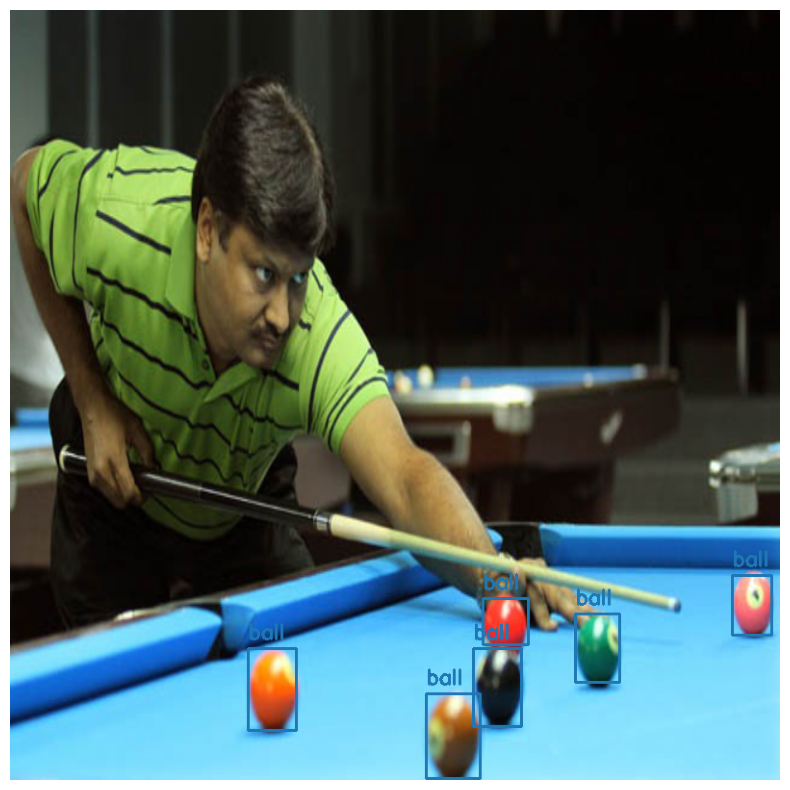

In [27]:
boxes_count = target["boxes"].size()[0]

image_np = image.permute(1, 2, 0).numpy()
image_with_predictions = draw_predictions(
    image_np, target["boxes"], 
    scores=[0.7] * boxes_count, 
    class_to_label_map={1: "ball"}, 
    classes=[1] * boxes_count,
)

show_image(image_with_predictions)


Чуть-чуть модифицируем функции вывода для работы с предсказаниями

In [28]:
def show_image(image, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

def draw_predictions(image, bboxes, scores, classes, class_to_label_map=None, threshold=0.5, color_palette_idx=0):
    palette = sns.color_palette(["#1f77b4", "#ff7f0e"], 2)
    image_with_predictions = image.copy()
    
    for bbox, score, class_int in zip(bboxes, scores, classes):
        if score < threshold:
            continue
        
        x1, y1, x2, y2 = bbox.astype(np.int32)
        label = class_to_label_map[class_int]
        color = palette[color_palette_idx]
        
        cv2.rectangle(image_with_predictions, (x1, y1), (x2, y2), np.array(color) * 255, 2)
        if class_to_label_map is not None:
            cv2.putText(image_with_predictions, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, np.array(color) * 255, 2)
        
        
    return image_with_predictions

Описание класса детектора, содержащее методы обучения/валидации

In [ ]:
from mean_average_precision import MetricBuilder

class BallDetector:
    def __init__(self, model, optimizer, scheduler, num_epochs=5):
        self.model = model

        self.optimizer = optimizer
        self.scheduler = scheduler

        self.num_epochs = num_epochs

    def train(self, train_loader):
        try:
            for epoch in range(self.num_epochs):
                self.model.train()

                for batch_images, batch_targets in train_loader:
                    images = [img.to(device) for img in batch_images]
                    targets = [{k: v.to(device) for k, v in t.items()} for t in batch_targets]

                    self.optimizer.zero_grad()
                    
                    losses_dict = self.model(images, targets)
                    losses = sum(loss for loss in losses_dict.values())
                    losses.backward()
                    
                    self.optimizer.step()

                self.scheduler.step()
                print(f"Epoch #{epoch + 1} loss: {losses.item()}")
        except KeyboardInterrupt:
            print("Interrupted")
    
    def eval(self, val_loader, pic_num=10, threshold=0.5):
        pic_printed = 0

        self.model.eval()
        class_to_label_map = {1: "ball"}  # Маппинг от класса в числовое значение

        metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=len(class_to_label_map))

        with torch.no_grad():
            for batch_images, batch_targets in val_loader:
                images = [img.to(device) for img in batch_images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in batch_targets]

                # Получаем предсказания модели
                predictions = self.model(images)

                for i in range(len(predictions)):
                    # Извлекаем предсказания
                    if pic_num > pic_printed: print(predictions[i])
                    
                    pred_boxes = predictions[i]['boxes'].cpu().numpy()
                    pred_scores = predictions[i]['scores'].cpu().numpy()
                    pred_labels = predictions[i]['labels'].cpu().numpy()

                    keep = pred_scores >= threshold
                    pred_boxes = pred_boxes[keep]
                    pred_scores = pred_scores[keep]
                    pred_labels = pred_labels[keep]

                    # Извлекаем истинные боксы
                    true_boxes = targets[i]['boxes'].cpu().numpy()
                    true_labels = targets[i]['labels'].cpu().numpy()

                    detections = np.hstack([pred_boxes, pred_scores[:, None], pred_labels[:, None]])
                    ground_truth = np.hstack([true_boxes, np.ones((true_boxes.shape[0], 1)), true_labels[:, None]])
                    print("detections: ", detections)
                    print("ground_truth: ", ground_truth)
                    
                    metric_fn.add(detections, ground_truth)

                    if pic_num > pic_printed:
                        pic_printed += 1
                        image = images[i].cpu().numpy().transpose(1, 2, 0)
                        image = image.astype(np.uint8)  # Преобразуем в 8-битное изображение

                        image_with_predictions = draw_predictions(
                            image,
                            pred_boxes,
                            pred_scores,
                            pred_labels,
                            class_to_label_map=class_to_label_map,
                            threshold=threshold,
                            color_palette_idx=0
                        )

                        final_image = draw_predictions(
                            image_with_predictions,
                            true_boxes,
                            np.ones(len(true_boxes)),  # Для истинных объектов считаем score равным 1
                            true_labels,
                            class_to_label_map=class_to_label_map,
                            threshold=threshold,
                            color_palette_idx=1
                        )

                        show_image(final_image)

        mAP = metric_fn.value(iou_thresholds=threshold)['mAP']
        print(f"mAP@{threshold}: {mAP}")

Определяем 2 класса: фон, мяч

In [30]:
NUM_CLASSES = 2

model = fasterrcnn_resnet50_fpn(pretrained=True)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES)

model = model.to(device)

C:\dev\miniconda\envs\ds\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\dev\miniconda\envs\ds\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [31]:
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)

In [32]:
detector = BallDetector(model, optimizer, scheduler, num_epochs=3)

In [33]:
from torch.utils.data import Subset

subset_indices = list(range(120))
train_subset = Subset(train_dataset, subset_indices)
subset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collater)

Методы сохранения/загрузки обученных моделей

In [34]:
def save_model(model, optimizer, scheduler, path="ball_detector.pth"):
    """Сохраняет состояние модели, оптимизатора и шедулера."""

    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict()
    }, path)

    print(f"Model saved to {path}")

def load_model(ball_detector, path="ball_detector.pth"):
    """Загружает состояние модели, оптимизатора и шедулера из файла."""

    checkpoint = torch.load(path)
    ball_detector.model.load_state_dict(checkpoint['model_state_dict'])
    ball_detector.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    ball_detector.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

Обучалась модель 6 эпох и 18 часов в сумме, loss на 6-ой эпохе был ~0,25

In [35]:
MODEL_STATE_READY = True

if MODEL_STATE_READY:
    load_model(detector)
else:
    detector.train(train_loader) # После некоторых исправлений, успел обучить только 3 эпохи

    # save_model(detector.model, detector.optimizer, detector.scheduler)

Результаты работы модели, первые 10 предиктов отобразим на картинках

C:\Users\artrsyf\AppData\Local\Temp\ipykernel_25580\2201268922.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target["boxes"] = torch.tensor(boxes, dtype=torch.float32) * RESIZE_HEIGHT


{'boxes': tensor([[3.0344e+02, 2.4674e+02, 3.4854e+02, 3.3156e+02],
        [3.9516e+02, 7.2625e+02, 4.6202e+02, 8.0000e+02],
        [2.3843e+02, 2.0375e+02, 3.0500e+02, 2.7507e+02],
        [7.6707e+02, 3.7084e+02, 7.8559e+02, 4.0724e+02],
        [4.8294e+02, 3.0157e+02, 5.0125e+02, 3.3653e+02],
        [6.8855e+02, 4.3008e+02, 7.3428e+02, 5.1052e+02],
        [3.9602e+02, 7.2380e+02, 4.3383e+02, 7.9191e+02],
        [3.1466e+02, 1.1095e+01, 7.9545e+02, 4.4924e+02],
        [5.1250e+02, 5.8560e+02, 5.5919e+02, 6.6184e+02],
        [5.8929e+01, 2.2640e+02, 7.7871e+01, 2.6414e+02],
        [6.7861e+02, 4.4139e+02, 7.6125e+02, 4.9210e+02],
        [2.9592e+02, 2.6665e+02, 3.7579e+02, 3.2153e+02],
        [3.4270e+01, 2.2498e+02, 5.4328e+01, 2.6561e+02],
        [6.2564e+02, 5.1383e+02, 6.7119e+02, 5.9976e+02],
        [3.9955e+01, 4.5258e+02, 4.8539e+01, 4.6818e+02],
        [1.8416e-01, 5.8008e+02, 1.7516e+01, 6.1659e+02],
        [6.9036e+02, 2.5138e+02, 7.3538e+02, 3.3937e+02],
    

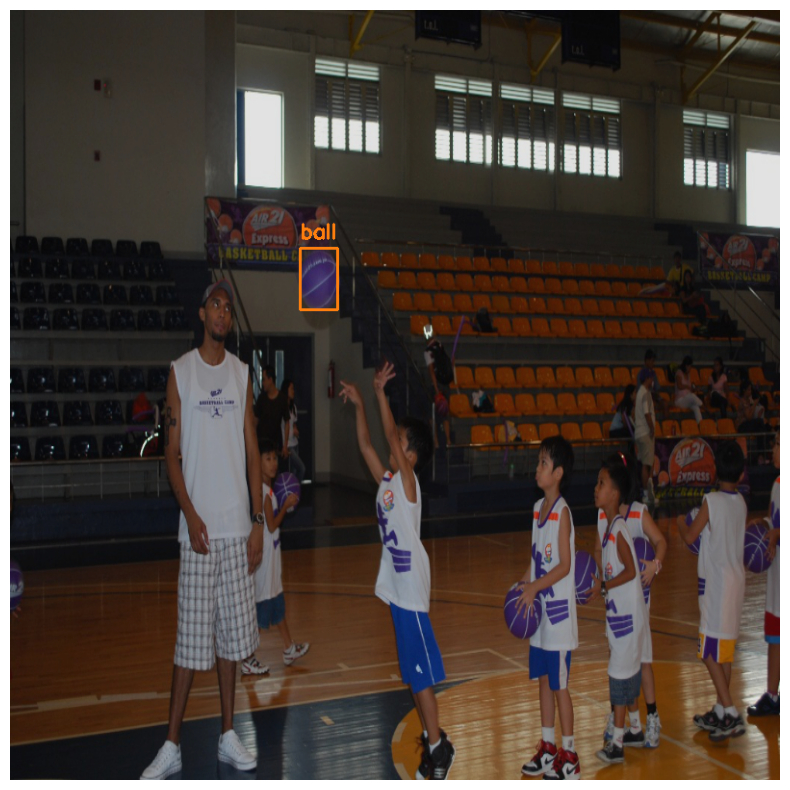

{'boxes': tensor([[3.3356e+02, 4.0468e+02, 4.3077e+02, 5.6768e+02],
        [1.0342e+02, 3.4378e+02, 6.5859e+02, 8.0000e+02],
        [1.8348e+02, 2.8061e+02, 2.7079e+02, 4.3341e+02],
        [2.9489e+02, 3.0422e+02, 3.9424e+02, 4.6493e+02],
        [5.8217e+02, 2.8101e+02, 6.5037e+02, 3.4802e+02],
        [9.2738e+00, 2.9015e-01, 7.1794e+02, 2.9567e+02],
        [2.5918e+02, 6.0332e+02, 6.7769e+02, 7.8061e+02],
        [4.4546e+02, 3.9531e+02, 5.4811e+02, 5.5343e+02],
        [2.1641e+01, 1.5948e+02, 3.5517e+02, 8.0000e+02],
        [5.9986e+02, 2.9776e+02, 6.4715e+02, 3.1974e+02],
        [2.7448e+02, 3.2529e+02, 5.4438e+02, 5.8596e+02],
        [2.1184e+02, 3.0768e+02, 2.6460e+02, 4.0205e+02],
        [6.0286e+02, 2.9681e+02, 6.2344e+02, 3.3183e+02],
        [8.0359e-01, 3.7913e+02, 1.9079e+02, 8.0000e+02],
        [4.4691e+01, 2.6178e+02, 6.0736e+02, 6.1541e+02],
        [6.1371e+02, 2.9171e+02, 6.4883e+02, 3.2629e+02],
        [1.4517e+01, 0.0000e+00, 4.7009e+02, 5.4649e+02],
    

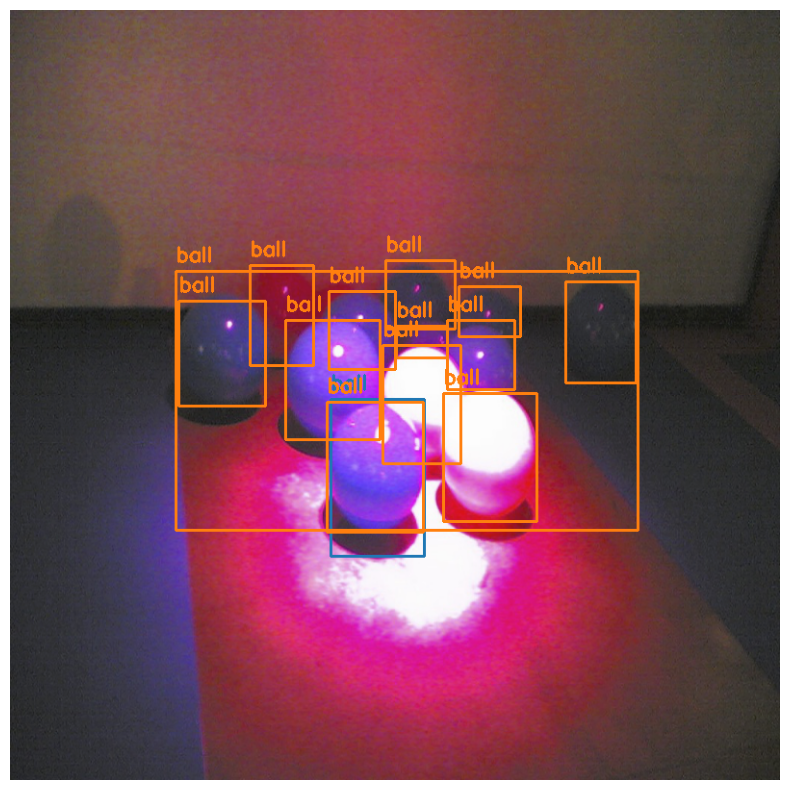

{'boxes': tensor([[535.2768, 159.3248, 786.0197, 544.3592],
        [554.4784, 433.3102, 625.5056, 505.5148],
        [324.3709, 660.8130, 472.8482, 782.2053],
        [491.3494, 180.2269, 786.1088, 360.1819],
        [665.0176, 291.9250, 759.0359, 436.4008],
        [  0.0000, 299.8297,  79.3964, 482.1083],
        [452.7455,  23.8271, 798.5459, 670.0879],
        [543.9159, 236.6689, 623.9210, 318.3864],
        [559.9020, 402.9261, 611.4659, 493.2498],
        [549.9822,  43.3492, 724.3213, 132.4703],
        [697.7096, 499.0799, 762.1884, 575.1653],
        [668.3691, 447.7569, 700.1272, 483.8643],
        [174.0381, 471.3508, 316.7184, 594.7594],
        [667.3027, 308.9437, 749.1707, 386.6486],
        [463.6051, 245.8899, 800.0000, 448.9830],
        [539.6960, 398.1844, 622.9271, 562.9983],
        [103.7868, 483.3323, 175.8367, 565.7291],
        [538.3159, 417.7381, 620.7740, 467.9432],
        [ 95.3063, 465.0821, 179.9969, 631.0056],
        [  0.0000, 335.6658, 113.1471, 4

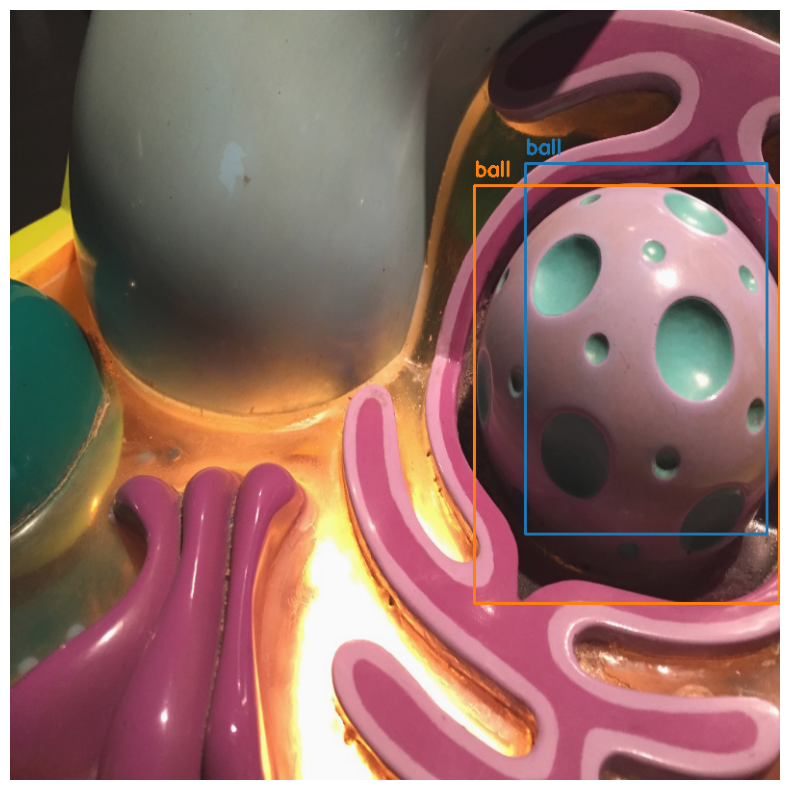

{'boxes': tensor([[450.0140, 166.4728, 582.3362, 306.2355],
        [469.3305, 239.5786, 585.8632, 393.6090],
        [173.7339, 588.6149, 199.9850, 627.7712],
        [ 70.1919, 589.9675, 101.2528, 636.1857],
        [489.2000, 246.5387, 511.4453, 280.5699],
        [363.1386, 536.8471, 425.1764, 621.6318]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.1249, 0.1130, 0.1033, 0.0867, 0.0575, 0.0553], device='cuda:0')}
detections:  []
ground_truth:  [[479.99996948 251.72720337 582.5        401.86724854   1.
    1.        ]]


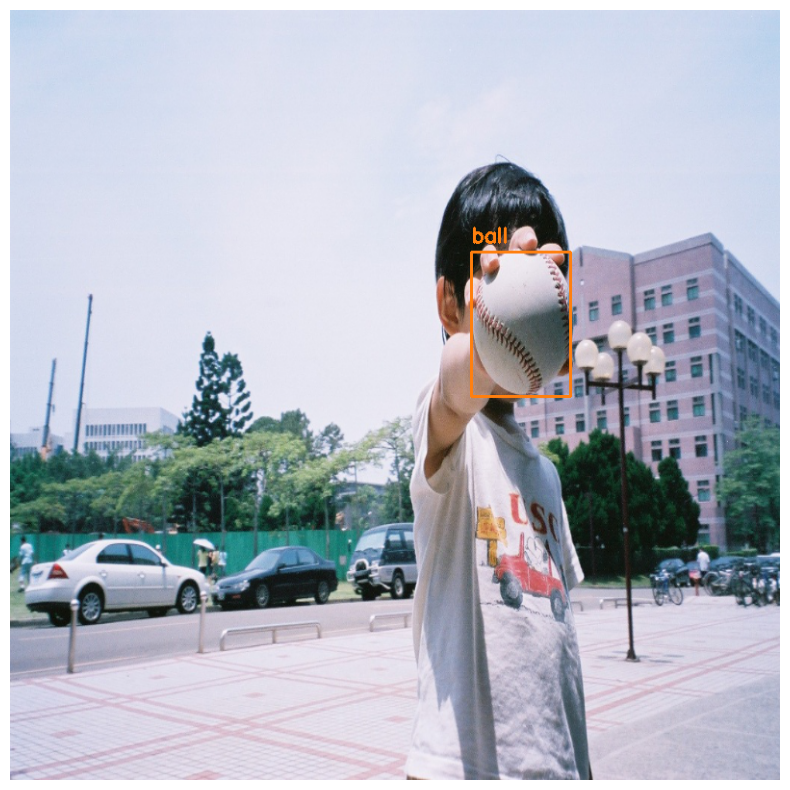

{'boxes': tensor([[385.0404, 218.8940, 473.7981, 385.6443],
        [597.6283, 230.6777, 725.4156, 394.9530],
        [401.9556, 513.2565, 635.6688, 789.9973],
        [  0.0000, 132.9101, 530.8097, 706.7885],
        [384.7005, 239.5688, 468.7555, 323.7857],
        [ 28.9098, 163.9924, 768.0381, 490.9578]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.3285, 0.2013, 0.1565, 0.0671, 0.0588, 0.0525], device='cuda:0')}
detections:  []
ground_truth:  [[392.99996948 228.89280701 466.5        342.96401978   1.
    1.        ]]


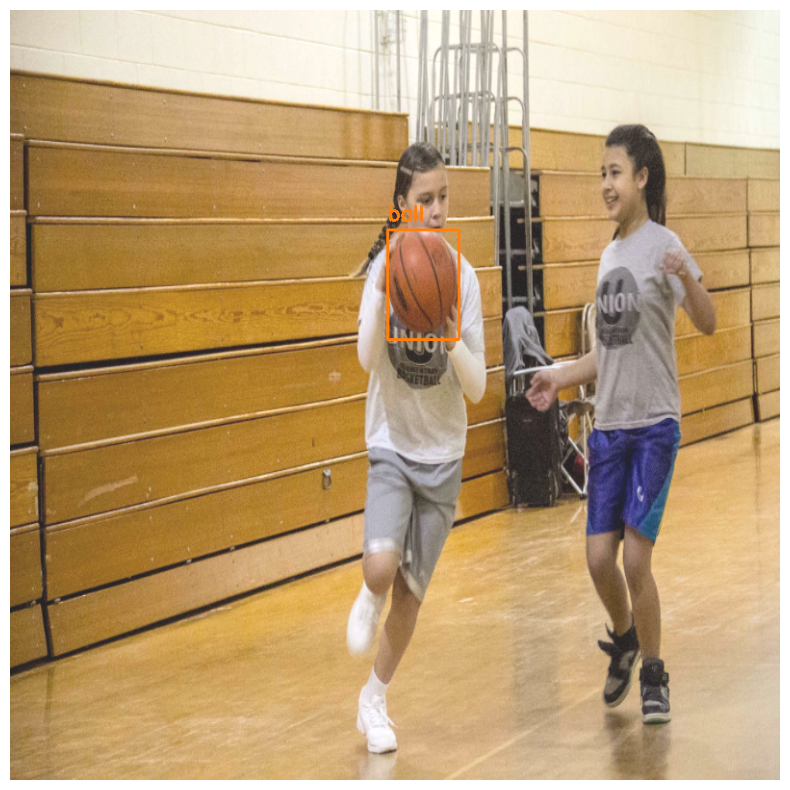

{'boxes': tensor([[465.0928, 395.2430, 482.3282, 415.7092],
        [275.0622, 537.9863, 298.9154, 576.3694],
        [ 99.5707, 224.1036, 144.3594, 310.8154],
        [433.2276, 454.3877, 455.3010, 492.6818],
        [681.8483, 702.1909, 726.2553, 787.6612],
        [443.0632, 454.9160, 453.5858, 489.2559],
        [445.9772, 459.8188, 451.4848, 486.8432],
        [ 72.0208, 202.9635, 158.3761, 373.8960],
        [441.0801, 457.7382, 448.1350, 485.0423],
        [ 77.7472, 233.6625, 155.1953, 280.7716],
        [750.3951, 513.7300, 798.1356, 593.6110],
        [269.5713, 543.8508, 306.4230, 569.7566],
        [375.8277, 524.3058, 800.0000, 791.6300],
        [ 84.7146, 474.5172, 171.9315, 653.1044],
        [345.8902, 654.1052, 368.2345, 689.5970],
        [238.1116, 385.2048, 258.5231, 429.2442],
        [474.8283, 393.5525, 478.6592, 412.1581],
        [765.9775, 516.1215, 789.8274, 557.3793],
        [461.8008, 384.4595, 482.9988, 419.5842],
        [296.6581, 213.1055, 342.1162, 3

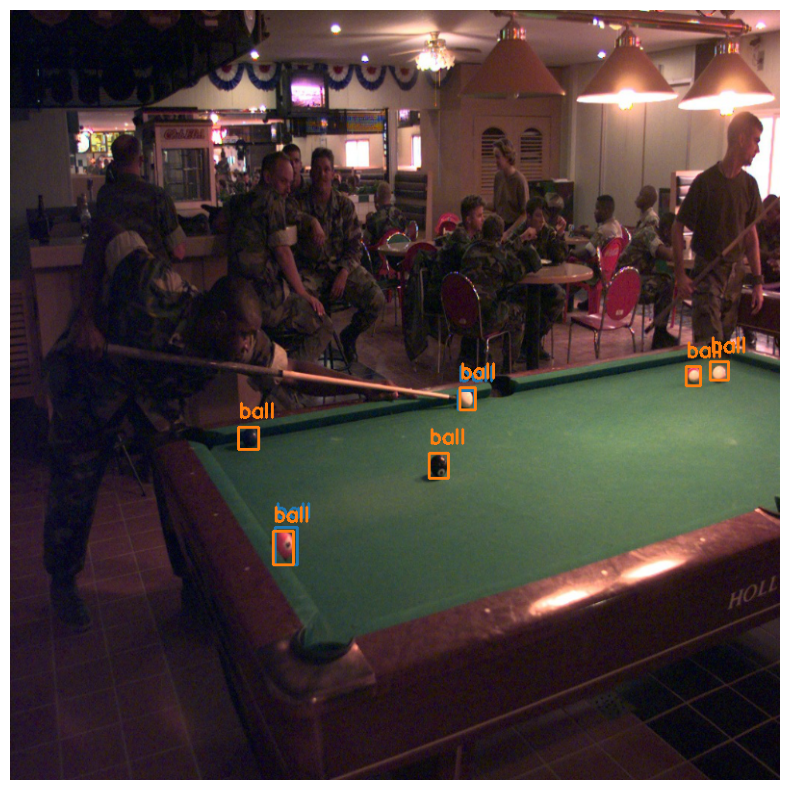

{'boxes': tensor([[2.3048e+02, 3.2176e+02, 2.9873e+02, 4.0636e+02],
        [7.0044e+01, 0.0000e+00, 8.9991e+01, 2.9528e+01],
        [1.6577e+02, 3.2315e+02, 3.0859e+02, 4.1110e+02],
        [2.1395e+02, 0.0000e+00, 2.3442e+02, 3.7721e+01],
        [6.2057e+01, 0.0000e+00, 8.2187e+01, 2.9643e+01],
        [5.7271e+01, 1.0367e+01, 1.0225e+02, 2.9895e+01],
        [2.2201e+02, 7.9109e+00, 2.4200e+02, 4.9027e+01],
        [2.0001e+02, 3.2869e+02, 2.9688e+02, 3.8325e+02],
        [7.3763e+01, 2.1435e-02, 9.4067e+01, 4.2185e+01],
        [5.1834e+02, 8.3617e+01, 6.5569e+02, 2.1979e+02],
        [2.1011e+02, 7.8653e+00, 2.3011e+02, 4.9272e+01],
        [3.1814e+02, 5.6381e+01, 3.3802e+02, 9.6525e+01],
        [2.0219e+02, 0.0000e+00, 2.4600e+02, 6.0816e+01],
        [3.5939e+02, 6.0842e+01, 3.7832e+02, 1.0144e+02],
        [6.5855e+01, 0.0000e+00, 8.6214e+01, 4.2211e+01],
        [2.5934e+02, 3.2188e+02, 3.0964e+02, 4.0780e+02],
        [4.6267e+02, 1.0655e+02, 5.3330e+02, 1.8553e+02],
    

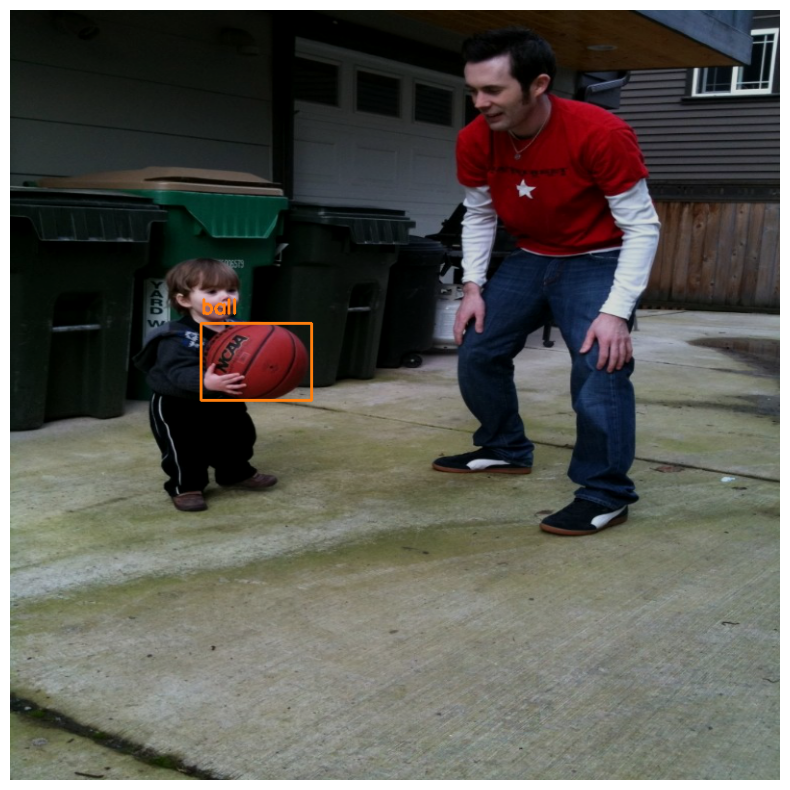

{'boxes': tensor([[3.0302e+02, 2.0535e+02, 5.2702e+02, 4.8197e+02],
        [1.0664e+02, 1.9086e+02, 6.4460e+02, 7.6285e+02],
        [0.0000e+00, 4.9815e+02, 7.4900e+02, 7.9934e+02],
        [2.7132e+02, 3.8548e+02, 8.0000e+02, 7.9358e+02],
        [9.2669e+00, 3.7953e+01, 3.5635e+02, 7.2808e+02],
        [5.4317e+01, 4.0493e+02, 3.3103e+02, 6.8336e+02],
        [1.2096e+01, 1.1873e+00, 7.9994e+02, 7.8785e+02],
        [1.7604e+02, 2.9341e+02, 7.7201e+02, 6.6095e+02],
        [1.0299e+02, 6.4856e+02, 4.7995e+02, 7.9724e+02],
        [1.9395e+02, 3.9447e+01, 5.5259e+02, 6.5543e+02],
        [2.3959e+01, 5.9974e+02, 2.9996e+02, 7.9703e+02],
        [6.2649e+01, 7.0162e+02, 1.3021e+02, 7.7240e+02],
        [1.3671e+02, 4.5741e+02, 3.1590e+02, 7.9519e+02],
        [8.0583e+00, 4.9454e+02, 1.8450e+02, 7.9690e+02],
        [2.2042e+02, 5.0747e+02, 3.5745e+02, 6.4830e+02],
        [2.1914e+02, 6.1699e+02, 6.1279e+02, 7.8657e+02],
        [0.0000e+00, 5.5432e+02, 3.1336e+02, 7.2724e+02],
    

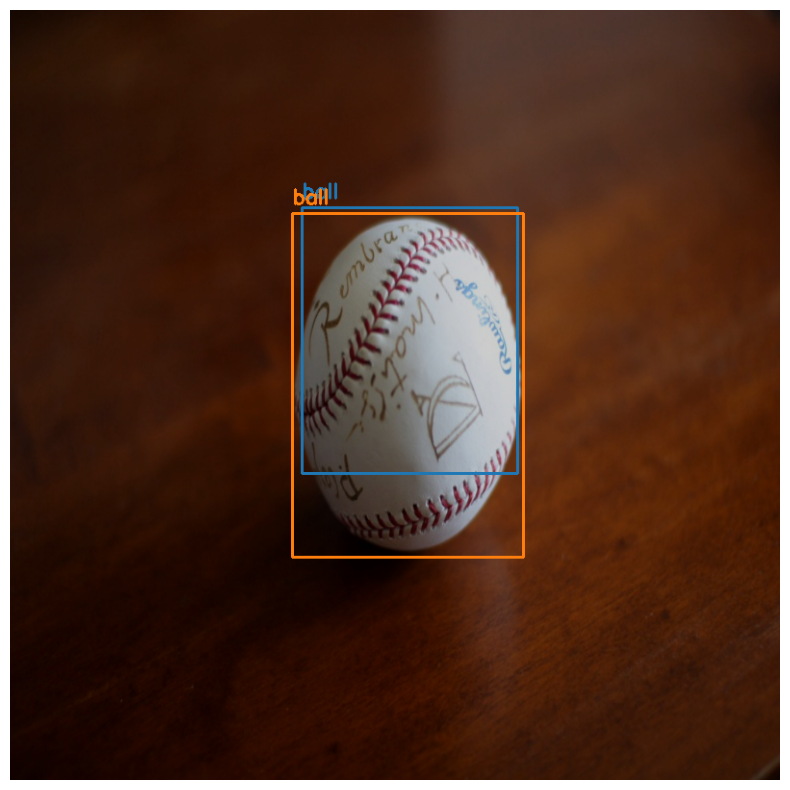

{'boxes': tensor([[2.7623e+02, 6.0481e+02, 4.0697e+02, 7.3471e+02],
        [1.6968e+02, 5.5958e+02, 2.3591e+02, 6.4852e+02],
        [1.3822e+02, 5.4383e+02, 2.3884e+02, 6.6461e+02],
        [6.2895e-01, 7.8554e+01, 2.4880e+01, 1.1431e+02],
        [4.9327e+02, 5.1651e+01, 5.6059e+02, 1.2636e+02],
        [7.4310e+01, 0.0000e+00, 1.1775e+02, 7.5062e+01],
        [3.1643e-01, 2.9995e+02, 3.8161e+01, 3.8801e+02],
        [3.4280e+02, 5.5988e+02, 4.2825e+02, 6.7269e+02],
        [7.5904e+01, 1.5505e+02, 1.1856e+02, 2.4612e+02],
        [3.5823e+02, 1.2648e+02, 5.2353e+02, 4.1642e+02],
        [1.0691e+01, 5.6420e+01, 1.8229e+02, 4.0117e+02],
        [1.2611e+02, 3.6962e+02, 1.6248e+02, 3.8261e+02],
        [1.1508e+02, 0.0000e+00, 1.5817e+02, 6.0964e+01],
        [0.0000e+00, 4.9799e+02, 6.9727e+02, 7.9989e+02],
        [0.0000e+00, 4.8887e+01, 2.9868e+01, 1.3225e+02],
        [2.6362e-01, 4.1018e+02, 3.8542e+01, 4.3007e+02],
        [4.6277e-01, 4.1075e+02, 3.2946e+01, 4.4592e+02],
    

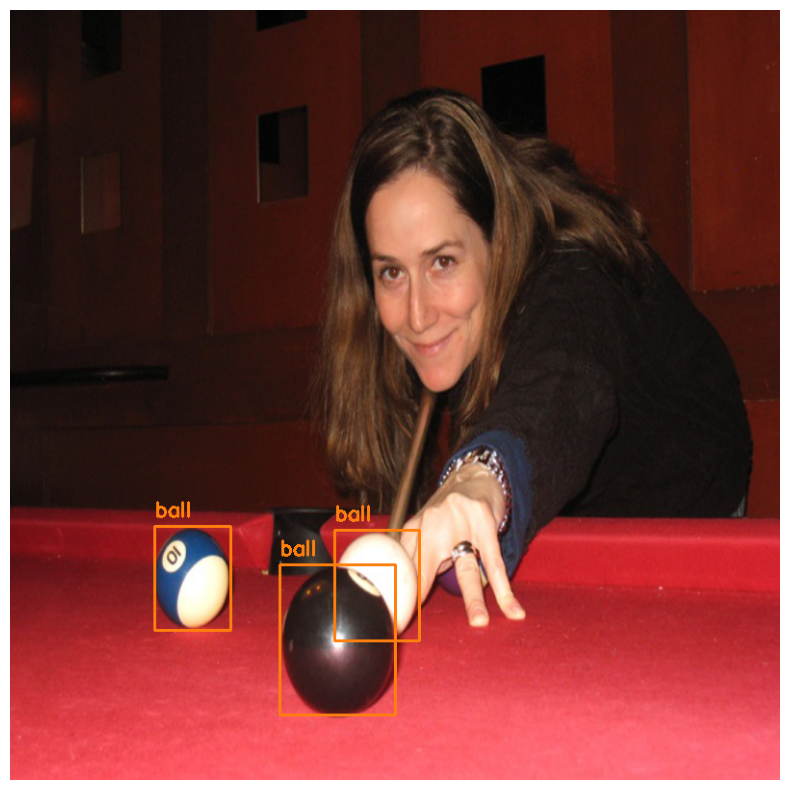

{'boxes': tensor([[ 40.6294, 610.6037, 127.9558, 731.4636],
        [ 17.1030, 237.4456,  86.4425, 331.2123],
        [369.2613, 468.1639, 461.7726, 642.1039],
        [189.8690, 236.8740, 245.1073, 317.5107],
        [727.6479, 700.3614, 774.1190, 772.1181],
        [559.8919, 471.8872, 639.3918, 617.9320],
        [284.4463, 685.5686, 308.5118, 720.9086],
        [644.5182, 235.7350, 695.8329, 333.3217],
        [634.1876, 563.7643, 685.2584, 660.9031],
        [283.5675, 691.8369, 331.5155, 717.1142],
        [418.3459,  32.6344, 521.4175, 218.4227],
        [ 21.8193, 234.5070, 133.9010, 347.7494],
        [556.1445, 507.5316, 637.3334, 569.4701],
        [359.3145, 683.0677, 381.7642, 727.0983],
        [  0.0000, 491.3048, 773.4614, 791.3805],
        [397.0803, 536.9517, 452.1554, 634.5619],
        [369.5670, 493.2914, 424.9437, 592.4702]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'), 'scores': tensor([0.6901, 0.6266,

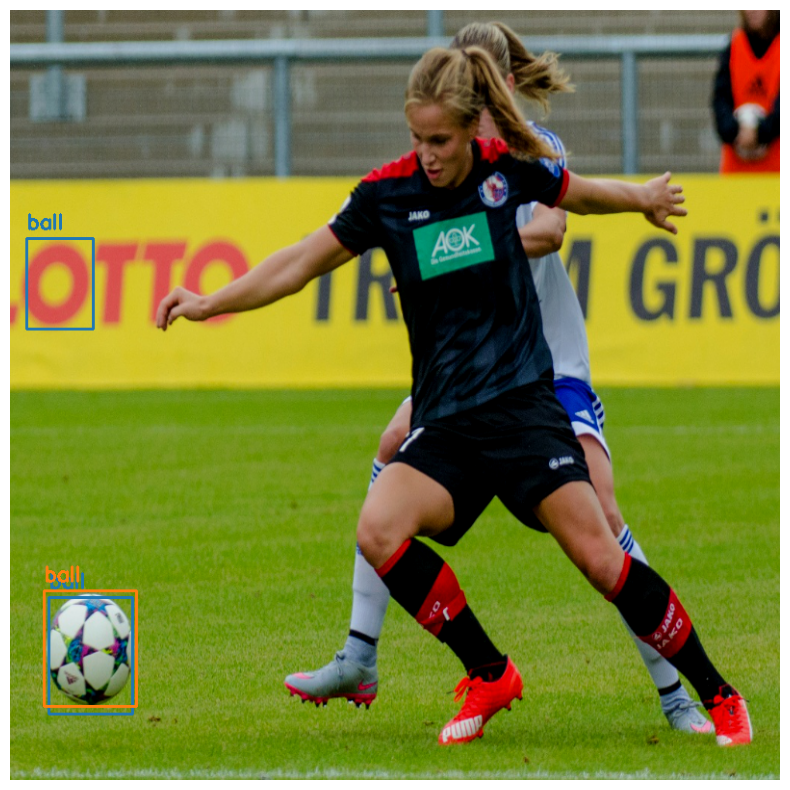

detections:  [[3.15699646e+02 2.20570709e+02 3.97372314e+02 4.00334015e+02
  6.30782425e-01 1.00000000e+00]
 [1.41434937e+01 1.10462036e+02 3.53964081e+02 7.90992554e+02
  5.11389613e-01 1.00000000e+00]]
ground_truth:  [[  0.          98.         406.         685.33355713   1.
    1.        ]]
detections:  []
ground_truth:  [[231.         147.33358765 545.5        642.           1.
    1.        ]]
detections:  []
ground_truth:  [[354.81756592 271.35681152 468.43838501 354.77359009   1.
    1.        ]]
detections:  []
ground_truth:  [[  0.           0.         799.5        799.33349609   1.
    1.        ]]
detections:  [[4.80015625e+02 9.89949799e+01 6.66117310e+02 4.21231750e+02
  7.18071342e-01 1.00000000e+00]
 [1.72821564e+02 8.62213745e+01 3.79066559e+02 3.79528931e+02
  5.94420135e-01 1.00000000e+00]
 [3.29427551e+02 1.79166397e+02 5.14550354e+02 5.42452820e+02
  5.06529033e-01 1.00000000e+00]]
ground_truth:  [[159.99998474  96.69519806 364.         410.95361328   1.
    1.     

In [ ]:
detector.eval(val_loader, pic_num=10)

## Выводы

- Выбрана предобученная нейронная сеть Faster RCNN;
- Под нее реализован класс датасета, добавлены некоторые аугментации;
- Реализован train-loop;
- Модель неплохо детектирует мячи, но, я думаю, есть некоторая проблема с разметкой данных, класс "ball" - очень общий;
- Мне нравится, как работает вычисления скора для предсказаний, мало False Positive предсказаний. Но все еще много False Negative предсказаний, когда модели не хватает уверенности для детекции мяча;
- Здесь крайне не понимаю задания с аугментациями. 
    - Простой препроцессинг изображений показал свою не особую эффективность еще в ДЗ 2, очевидно, что любое изменение выгодное для одного изображение не выгодно для другого. Но в этом случае придется еще провести большую работу по подгону боксов под изменения;
    - Если обратиться к определению аугментаций, то это добавление новых изображений на основе имеющихся, однако датасет и так довольно большой, и я в этом вообще не вижу смысла. Тем более, на ~4 GB VRAM одна эпоха длится 3+ часа, очень сложно экспериментировать;
    - Единтсвенное, что нахожу полезным, повышение контраста.
